In [1]:
%run lgs03a_data_unification.ipynb

In [2]:
epistatic_pairs_pos = {gene : 
                     doublemuts[doublemuts.gene==gene+'GFP'].groupby('position_pseudo').apply(
                                                                             lambda x: list(x['epistasis']))
                     for gene in ['amac', 'amacV14L', 'cgre', 'pplu', 'av']}
epistatic_pairs_pos = {gene : dict(epistatic_pairs_pos[gene]) for gene in epistatic_pairs_pos}

In [2]:
%run lgs_figures_functions_new.ipynb

{'amacGFP': 2.6522463410033232, 'cgreGFP': 2.7708520116421442, 'ppluGFP': 2.7708520116421442, 'avGFP': 1.283419239}


C:\Users\lgonzale\Anaconda3\lib\site-packages\FlowCytometryTools\core\docstring.py:56: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  doc = dedent(doc)


<Figure size 432x288 with 0 Axes>

In [3]:
import warnings
warnings.filterwarnings(action='ignore')

In [5]:
genes = ['amac','av','cgre','pplu']

In [7]:
import cmocean
from matplotlib.colors import ListedColormap

c = cmocean.cm.rain_r

colors = {'amacV14L':c(0), 'V14L':c(0),'amacV14LGFP':c(0),'amacGFP:V14L':c(0), 
          'amac':c(50), 'amacGFP':c(50), 
          'cgre':c(110), 'cgreGFP':c(110),
           'pplu':c(170),  'ppluGFP':c(170),'ppluGFP2':c(170),
          'av':c(220), 'avGFP':c(220), }

# Overview

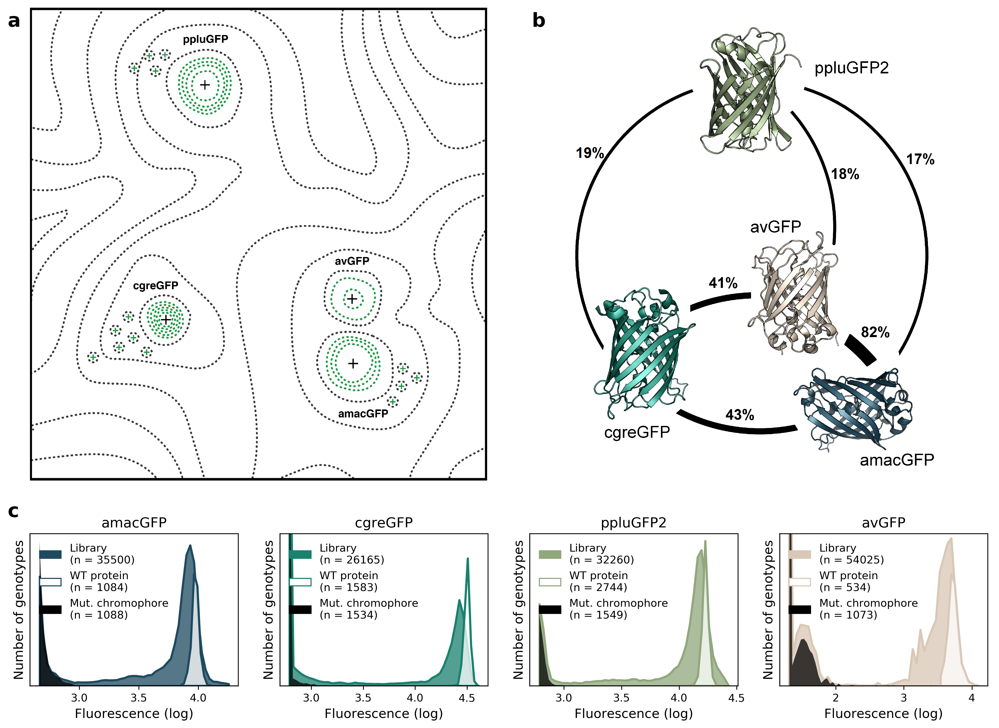

In [8]:
plt.figure(figsize=[16,12], dpi=300)

plt.subplot(4,4,(1,10))
show_image(os.path.join(figures_folder, 'other_images', 'katya_fig1_v2.png'))

plt.subplot(4,4,(3,12))
show_image(os.path.join(figures_folder, 'other_images', 'structures_identity_gfps2.png'))


for i,g in zip([13,14,15,16], ['amacGFP', 'cgreGFP', 'ppluGFP', 'avGFP']):
    ax = plt.subplot(4,4,i)
    plot_library_distributions(g, data_nt, data_aa, ax)   
    plt.ylabel('Number of genotypes', fontsize=12)
    
    if i==13:
        plt.text(2.4, 19500, 'a', fontsize=18, weight='semibold')
        plt.text(6.8, 19500, 'b', fontsize=18, weight='semibold')
        plt.text(2.4, 5000, 'c', fontsize=18, weight='semibold')

# plt.savefig(os.path.join(figures_folder,'eLife_final_figs', 'elife_fig1.png'), dpi=300)

# Comparisons of genes

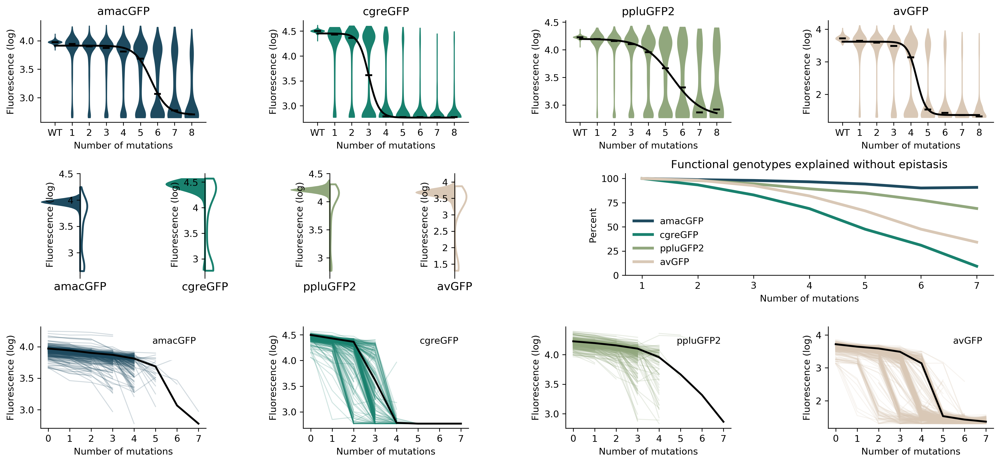

In [9]:
plt.figure(figsize=[15,7], dpi=300)

# Violinplots of N-mutants
for i,gene in zip([1,2,3,4], ['amacGFP', 'cgreGFP', 'ppluGFP', 'avGFP']):
    ax = plt.subplot(3,4,i)
    get_fitnesses_by_nmut(gene, 9, data_nt, data_aa , fit=True)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.title(names[gene])
    
# Buried vs exposed residues
for i,gene in zip([1,2,3,4], ['amacGFP', 'cgreGFP', 'ppluGFP', 'avGFP']):
    plt.subplot(3,8,i+8)
    plot_buried_vs_exposed_violins_singles(gene)
    plt.ylabel('Fluorescence (log)', fontsize=10)
    
# Landscapes pf single mutants
for i,gene in zip([1,2,3,4], ['amacGFP', 'cgreGFP', 'ppluGFP', 'avGFP']):
    ax = plt.subplot(3,4,i+8)
    plot_singlemut_landscapes(gene)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
# Expected vs observed bright genotypes
ax = plt.subplot(3,2,4)
plot_predicted_bright_vs_real(data_aa, False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
label_plot_axis(x = 'Number of mutations', t='Functional genotypes explained without epistasis', 
                y='Percent', fontsize_t=12, fontsize_x=10, fontsize_y=10)
    
plt.tight_layout(pad=1)

# Effect change of mutations across genes

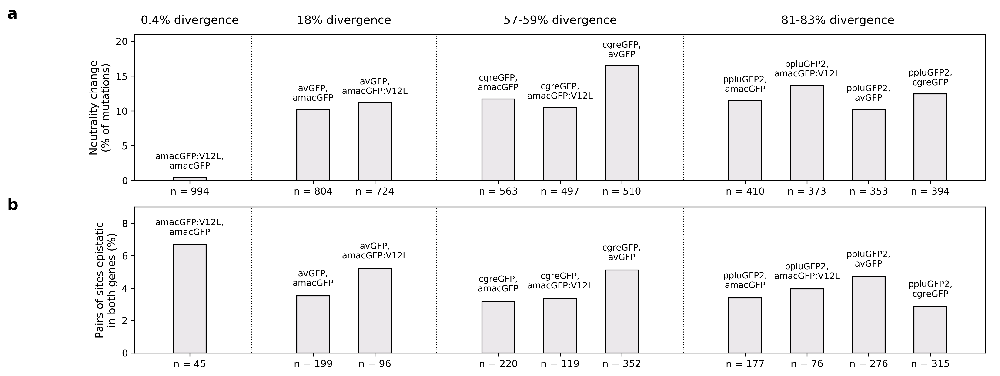

In [10]:
fig = plt.figure(figsize=[15,6], dpi=300)
make_figure_letters(fig, {'a':(-0.15,1.05), 'b':(-0.15,0.45)}, fontsize=16)

ax1,ax2 = fig.add_subplot(2,1,1), fig.add_subplot(2,1,2)
plot_bars_effectchange_epimaintain_split(ax1,ax2, 1.5, c=cmocean.cm.rain_r(250))
plt.tight_layout()
# plt.savefig(os.path.join(figures_folder, 'eLife_final_figs', 'elife_fig3.png'), dpi=300)

# Testing neural net predictions

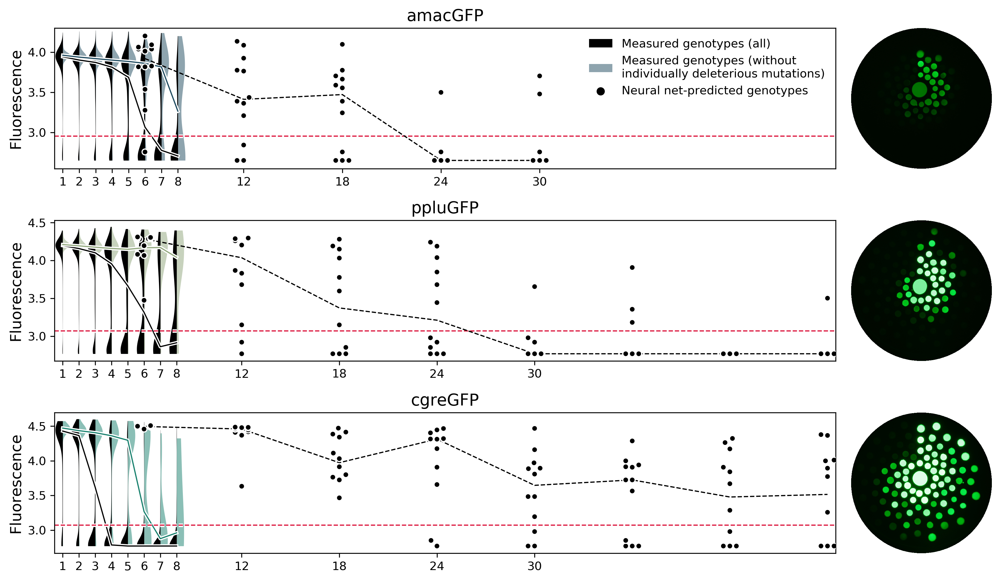

In [11]:
fig = plt.figure(figsize=[12,7], dpi=300)

for i,gene in [(1,'amac'), (7,'pplu'), (13,'cgre')]:
    plt.subplot(3,6,(i, i+4))
    plot_predictions(gene,mode='full', threshold = stds[gene]*3,
                 color=[[colors[gene],colors[gene]],['k','k'],], )
    
    if i==1: # legend
        plt.hist([-10], color='k', label='Measured genotypes (all)')
        plt.hist([-10], bottom=3, color=colors['amac'], alpha=0.5, 
                 label='Measured genotypes (without\nindividually deleterious mutations)')
        plt.scatter([-1],[3],color='k', label = 'Neural net-predicted genotypes', zorder=10)
        plt.legend(frameon=False, loc='upper right')
        plt.ylim(2.55, 4.3)
        
    label_plot_axis(y='Fluorescence', t=f'{gene}GFP', fontsize_t=14)
    plt.xticks(list(range(8))+[11,17,23,29], list(range(1,9))+[12,18,24,30])

    plt.subplot(3,6,i+5)
    show_image(os.path.join(figures_folder, 'other_images', f'prediction_blobs_{gene}.png'))
    
plt.tight_layout()

# FACS library sorting

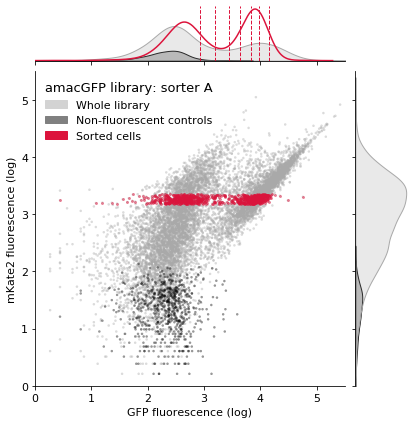

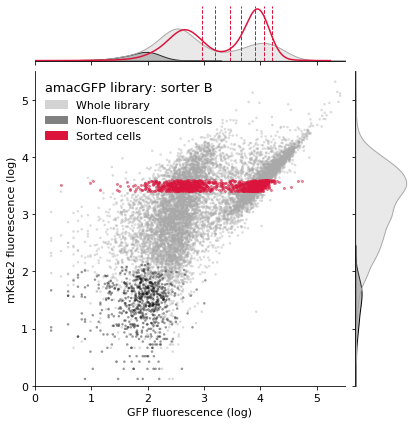

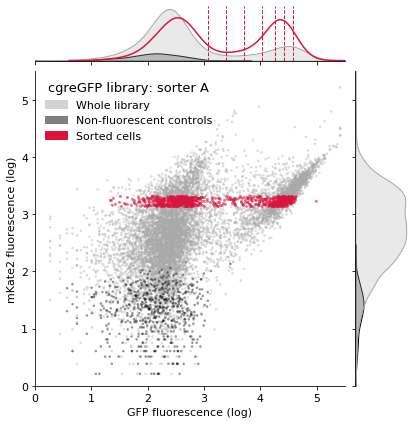

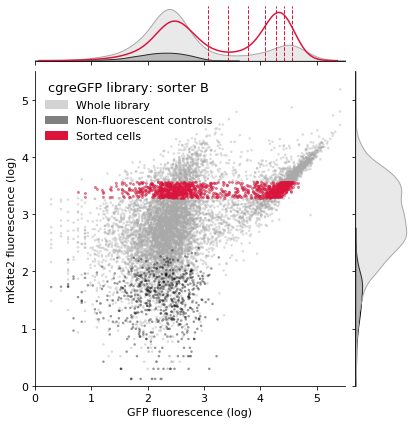

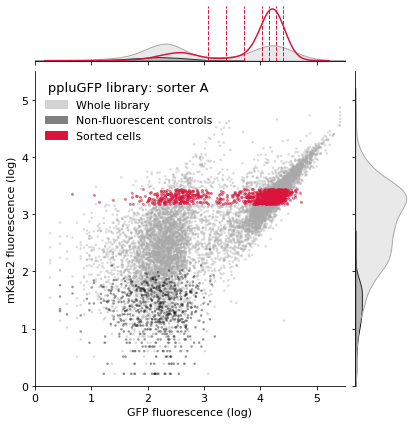

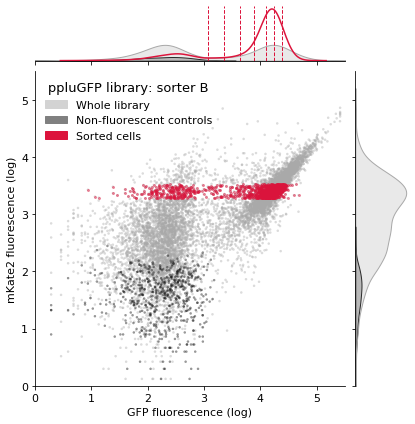

In [12]:
for gene in ['amac', 'cgre', 'pplu']:
    for machine in ['A', 'B']:
        sortingplot_library_scatter(gene, machine)

# Extant vs non-extant mutations

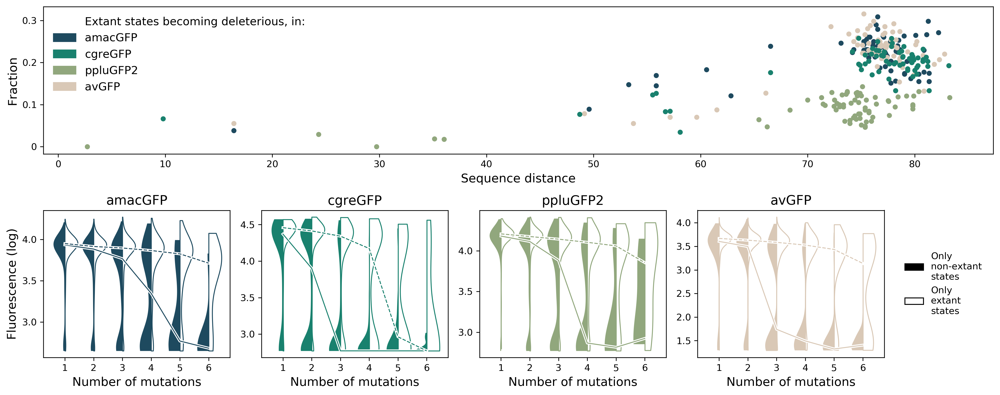

In [13]:
fig = plt.figure(figsize=[15,6], dpi=300)
make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.5)}, fontsize=15)

j=9

# scatterplot of extant states becoming deleterious
plt.subplot(2,j,(1,j))
for gene in ['amac','av','cgre','pplu']:
    compare_against_extant(gene, data_aa, nok=-0.15, overlap_n=1, s=20, marker='o')
legendary(['w']+[colors[gene] for gene in ['amac','cgre','pplu','av']], 
          ['Extant states becoming deleterious, in:','amacGFP','cgreGFP','ppluGFP2','avGFP'],
         fontsize=12, )
plt.yticks([0,0.1,0.2,0.3],[0,0.1,0.2,0.3])
label_plot_axis(x='Sequence distance', y='Fraction')

# violin plots of extant v. non-extant mutation effects
i = j+1
for gene in ['amac','cgre','pplu','av',]:
    ax = fig.add_subplot(2,j,(i,i+1))
    plot_extant_vs_nonextant_muts(gene, data_aa, n=7, )
    plt.title(names[gene], fontsize=14)
    if  i==j+1:
        plt.ylabel('Fluorescence (log)')
    i += 2
#     ax.get_legend().remove()
    
ax = fig.add_subplot(2,j,j*2)
legendary(['k','w'], ['Only\nnon-extant \nstates', 'Only\nextant\nstates'], ['k','k'], loc='center right')
plt.axis('off')
    
plt.tight_layout()

# Mutation effects by position

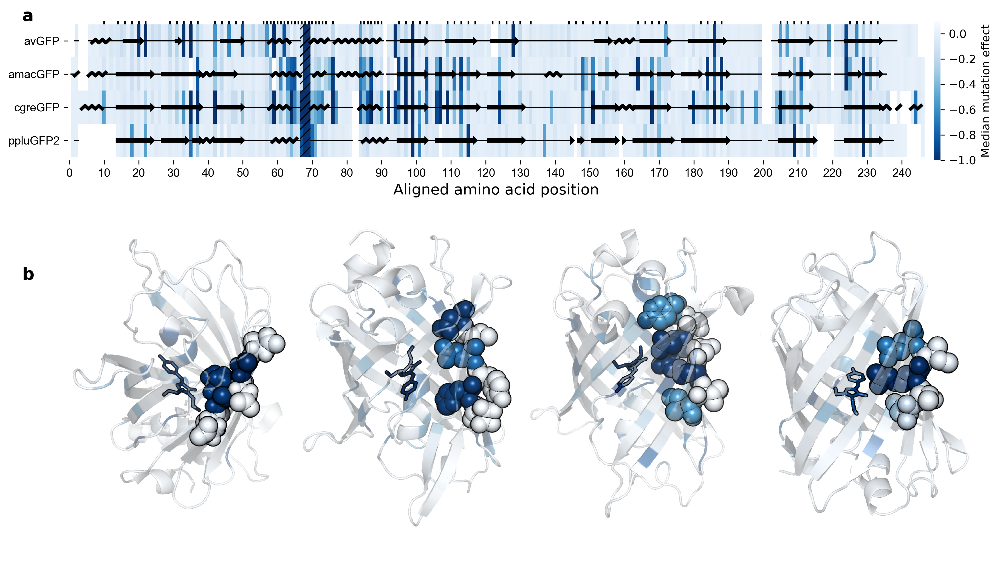

In [14]:
fig = plt.figure(figsize=[13,7], dpi=300)
make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.5)}, fontsize=15)

ax1 = fig.add_subplot(3,1,1)
plot_positional_effects_heatmap(df=df_effects_singles_scaled, cm = 'Blues_r')
plt.title('')

ax2 = fig.add_subplot(3,1,(2,3))
show_image(os.path.join(figures_folder, 'other_images', 'allGFPs_scaled_effectsByPos2.png'))
    
plt.tight_layout()

# Epistasis overview

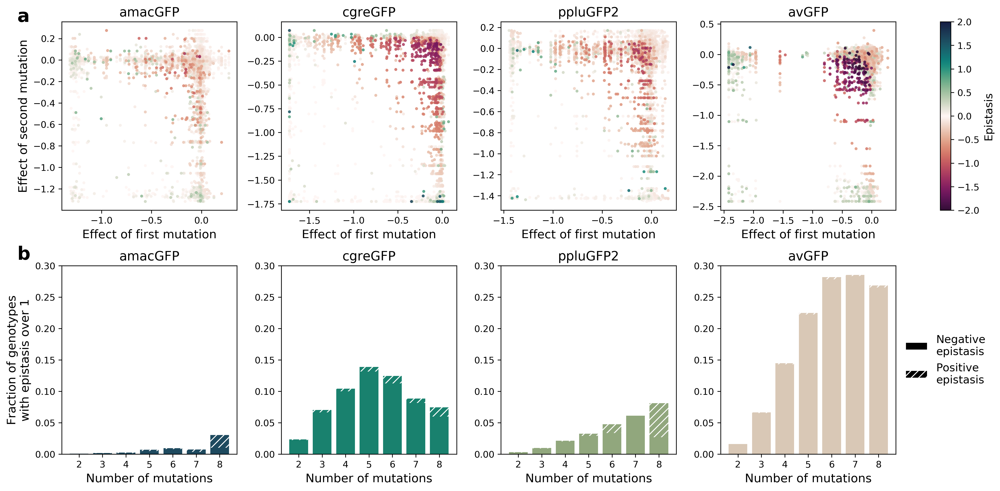

In [15]:
fig = plt.figure(figsize=[16,8], dpi=300)

make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.45)}, fontsize=20)


j = 17
for i,gene in zip(range(1,j*2,4), ['amac', 'cgre', 'pplu', 'av']):
    ax1 = fig.add_subplot(2,j,(i, i+3))
    doublemut_scatterplot(gene, cm = cmocean.cm.curl_r) 
    plt.title(names[gene], fontsize=14)
    
    if i>1:
        plt.ylabel('')
    ax2 = fig.add_subplot(2,j,(i+j,i+j+3))
    barplot_epistasis(gene, e=1)
    plt.title(names[gene], fontsize=14)
    if i>1:
        plt.ylabel('')
    plt.ylim(0, 0.3)
        

ax3 = fig.add_subplot(2,j,j)
norm = matplotlib.colors.Normalize(vmin=-2, vmax=2)
cb1 = matplotlib.colorbar.ColorbarBase(ax3, cmap=cmocean.cm.curl_r,norm=norm,orientation='vertical')
cb1.ax.tick_params(labelsize=10)
cb1.set_label('Epistasis',color='k',size=12)
        
ax4 = fig.add_subplot(2,j,j*2)
plt.legend([mpatches.Patch(facecolor='k', edgecolor='w'),
    mpatches.Patch(facecolor='k', hatch='///', edgecolor='w')], ['Negative\nepistasis', 'Positive\nepistasis'],
          frameon=False, loc='center', fontsize=12)
plt.axis('off')

plt.tight_layout() 

# Physical distance between epistatic pairs

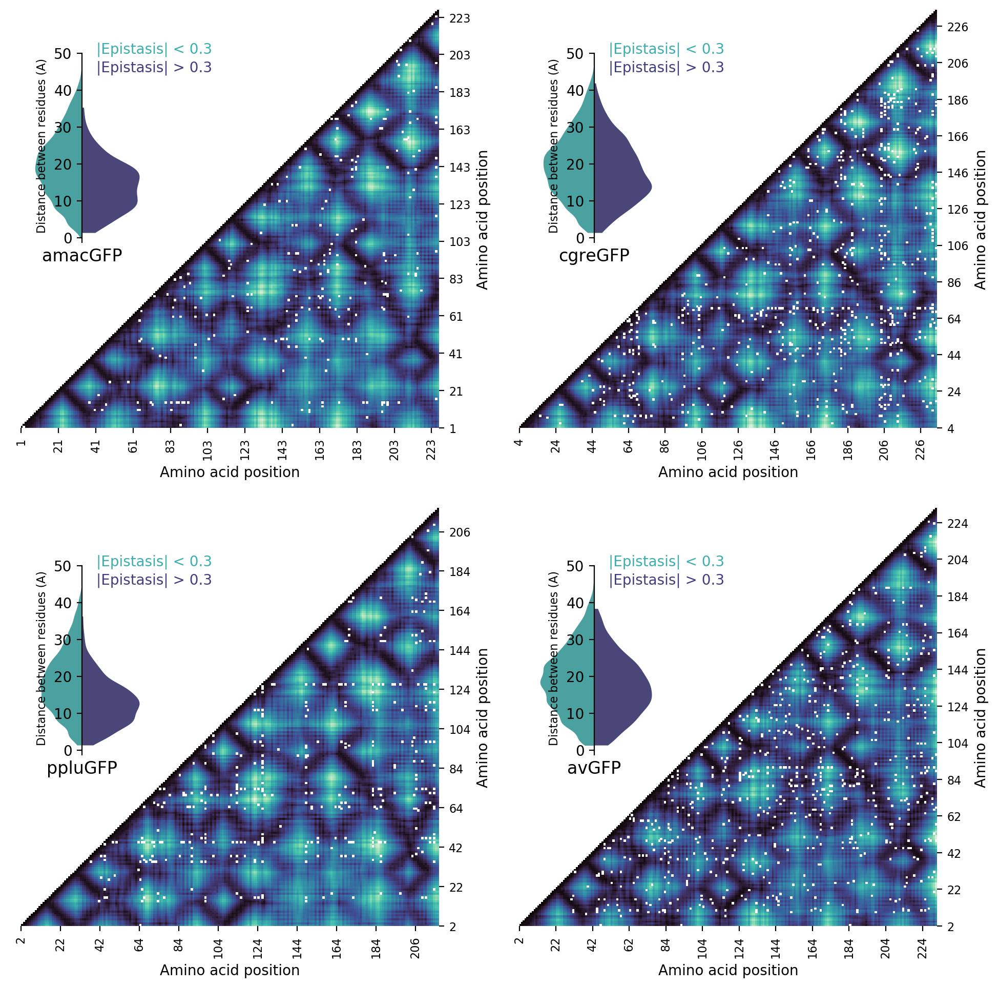

In [16]:
plot_all_distance_maps(df=doublemuts, c = sns.cm.mako)

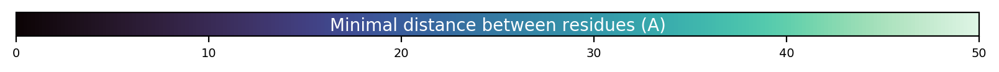

In [17]:
mako = ListedColormap(sns.color_palette('mako', 256))
fig,ax = plt.subplots(figsize=[10,0.5], dpi=200)
fig.subplots_adjust(bottom=0.5)

norm = matplotlib.colors.Normalize(vmin=0, vmax=50)
cb1 = matplotlib.colorbar.ColorbarBase(ax, cmap=mako,norm=norm,orientation='horizontal')
cb1.ax.tick_params(labelsize=7)
cb1.set_label('Minimal distance between residues (A)',labelpad=-25, color='w',)

# Urea sensitivity

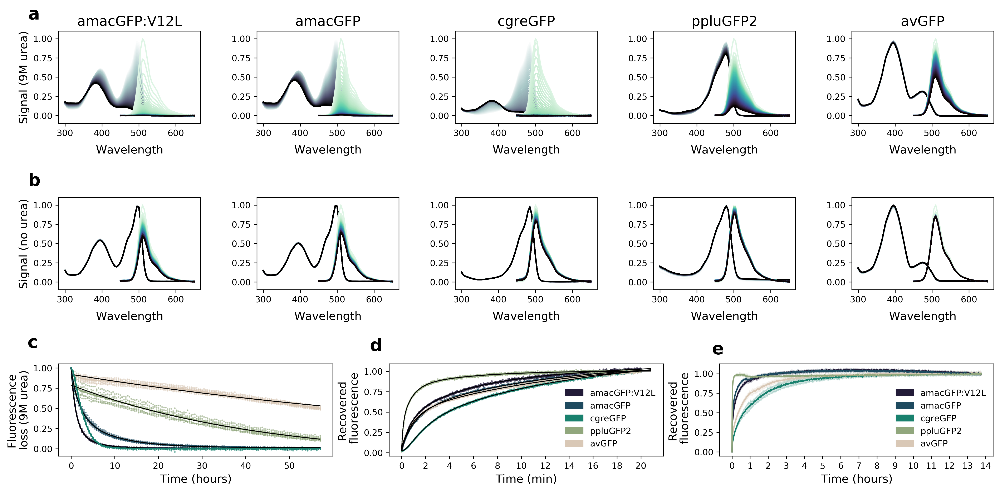

In [18]:
plt.figure(figsize=[16, 8], dpi=300)

for i,gene in zip(range(1,15,3),['amacV14L', 'amac', 'cgre', 'pplu', 'av']):
    plt.subplot(3,15,(i,i+2))
    plot_spectra(gene=gene, treatment='urea')
    label_plot_axis(t=names[gene],)
    plt.xlabel('Wavelength', labelpad=8)
    if i==1:
        plt.ylabel('Signal (9M urea)')
        plt.text(200, 1.25, 'a', fontsize=20, weight='semibold')
        
    ax2 = plt.subplot(3,15,(i+15, i+15+2))
    plot_spectra(gene=gene, treatment='pbs')
    plt.xlabel('Wavelength', labelpad=8)
#     ax2.xaxis.tick_top()
    if i==1:
        plt.ylabel('Signal (no urea)')    
        plt.text(200, 1.25, 'b', fontsize=20, weight='semibold')
        
# plt.tight_layout()
    
plt.subplot(3,15,(31,35))
plot_urea_fluo_loss()
label_plot_axis(y = 'Fluorescence\nloss (9M urea)', x = 'Time (hours)')
plt.text(-10, 1.25, 'c', fontsize=20, weight='semibold')

    
plt.subplot(3,15,(36,40))
plot_refolding('short')
plt.ylabel('Recovered\n fluorescence')
legendary([colors[gene] for gene in ['amacV14L','amac','cgre','pplu','av']],
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'])
plt.text(-160, 1.25, 'd', fontsize=20, weight='semibold')

plt.subplot(3,15,(41,45))
plot_refolding('long')
plt.ylabel('Recovered\n fluorescence')
legendary([colors[gene] for gene in ['amacV14L','amac','cgre','pplu','av']],
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'])
plt.text(-4000, 1.25, 'e', fontsize=20, weight='semibold')
    
    
plt.tight_layout()

# amacGFP vs amacGFP:V12L

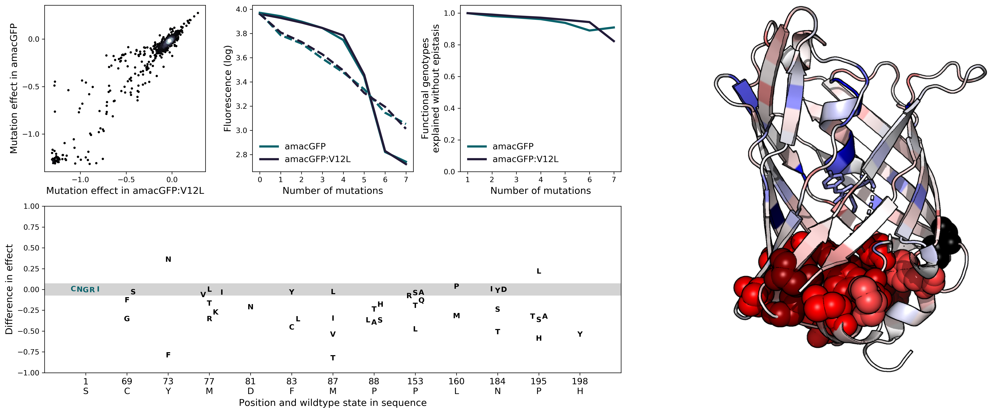

In [19]:
fig = plt.figure(figsize=[20,8], dpi=300)
# make_figure_letters(fig, {'a':(-0.03,1), 'b':(0.17,1), 'c':(0.38,1), 'd':(0.6,1), 'e':(-0.03,0.45)}, 
#                     fontsize=20)

plt.subplot(2,5,1)
scatter_amac_v14l_mut_effects()

plt.subplot(2,5,2)
cm = cmocean.cm.rain_r
amac_v14l_nmut_medians(n = 8)

plt.subplot(2,5,3)
amac_v14l_obs_exp_bright()

plt.subplot(2,5,(6,8))
amac_v14l_mutposeffect()

plt.subplot(2,5,(4,10))
show_image(os.path.join(figures_folder, 'other_images', 'amac_amacV14L_difference.png'))

plt.tight_layout()

# Synonymous mutations

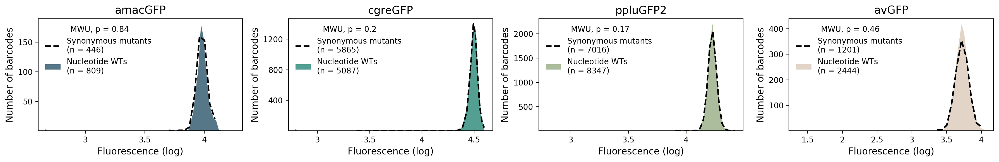

In [20]:
plt.figure(figsize=(18,3), dpi=200)
plt.axis('off')

yticks = {'amacGFP': [50,100,150], 'cgreGFP':[400,800,1200], 
          'ppluGFP':[500,1000,1500,2000], 'avGFP':[100,200,300,400]}
xticks = {'amacGFP': [3,3.5,4], 'cgreGFP':[3,3.5,4,4.5], 'ppluGFP':[3,3.5,4,4.5], 'avGFP':[1.5,2,2.5,3,3.5,4]}
xlims = {gene : (data_aa[(data_aa.gene==gene)]['brightness'].min() - 0.05, 
                 data_aa[(data_aa.gene==gene)]['brightness'].max() + 0.05)
                for gene in ['amacGFP','cgreGFP','ppluGFP','avGFP']}

for i,gene in zip([1,2,3,4], ['amacGFP','cgreGFP','ppluGFP','avGFP']):
    ax = plt.subplot(1,4,i)
    plot_wts_and_synmuts(gene, bcs, yticks=yticks[gene], xticks=xticks[gene])
#     if gene!='amacGFP':
#         plt.ylabel('')
    plt.xlim(xlims[gene])
    plt.title(names[gene], fontsize=14)
    
plt.tight_layout()

# Protein thermostability

amacV14L: L = 2.692551155667289, x0 = 80.38800006078053, k = 0.859351341629915, b = -3.1767309079670807
amac: L = 2.6140932241650328, x0 = 82.6303267048625, k = 0.7241312365215388, b = -3.337282815269062
cgre: L = 5.609848988918248, x0 = 71.24792360419332, k = 1.2684480435786951, b = -5.534120687527071
pplu: L = 1.9591876969557127, x0 = 86.38540787212203, k = 0.6297342164525306, b = -1.4568879092686993
av: L = -4.03077587259635, x0 = 83.72176080346874, k = 0.6685226611014845, b = -1.8771918640751692


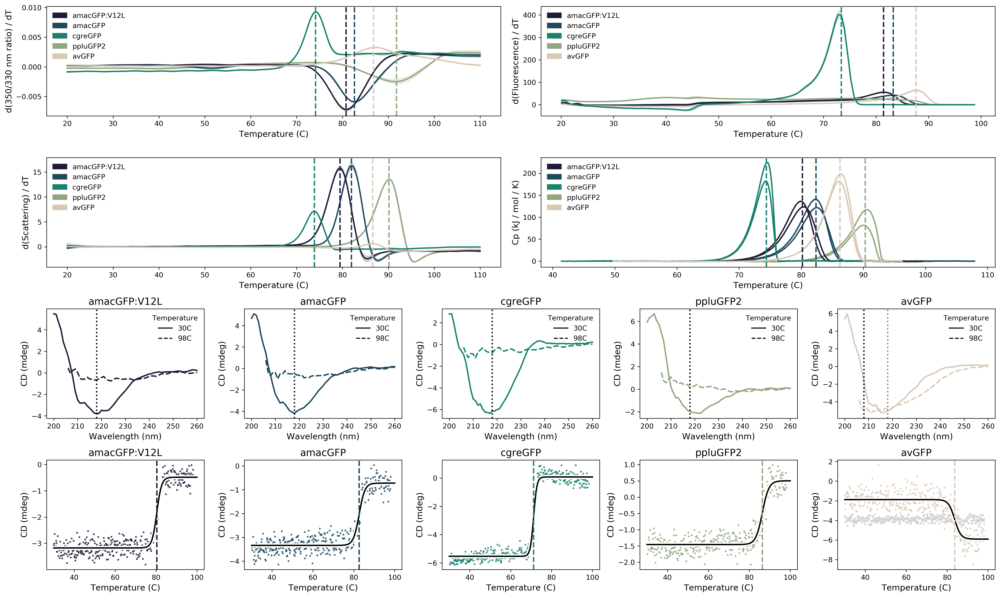

In [21]:
fig = plt.figure(figsize=[20,12], dpi=300)
plt.axis('off')

plt.subplot(4,10,(1,5))
label_plot_axis(y = 'd(350/330 nm ratio) / dT', fontsize_y=12)
plot_dsf('ratio')
legendary([colors[gene] for gene in ['amacGFP:V14L','amacGFP','cgreGFP','ppluGFP2','avGFP']], 
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'], loc='upper left')

plt.subplot(4,10,(6,10))
label_plot_axis(y = 'd(Fluorescence) / dT', fontsize_y=12)
plot_qpcr()
legendary([colors[gene] for gene in ['amacGFP:V14L','amacGFP','cgreGFP','ppluGFP2','avGFP']], 
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'], loc='upper left')

plt.subplot(4,10,(11,15))
label_plot_axis(y = 'd(Scattering) / dT', fontsize_y=12)
plot_dsf('scatter')
legendary([colors[gene] for gene in ['amacGFP:V14L','amacGFP','cgreGFP','ppluGFP2','avGFP']], 
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'], loc='upper left')

plt.subplot(4,10,(16,20))
label_plot_axis(y = 'Cp (kJ / mol / K)', fontsize_y=12)
plot_dsc()
legendary([colors[gene] for gene in ['amacGFP:V14L','amacGFP','cgreGFP','ppluGFP2','avGFP']], 
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'], loc='upper left')

for i,gene in zip([21,23,25,27,29], ['amacV14L', 'amac', 'cgre', 'pplu', 'av']):
    plt.subplot(4,10,(i,i+1))
    plt.title(names[gene], fontsize=14)
    plot_cd_spectra(gene)
    plt.subplot(4,10,(i+10,i+11))
    plot_cd_melting(gene)
    plt.title(names[gene], fontsize=14)
    
plt.tight_layout()

# SEC-MALS

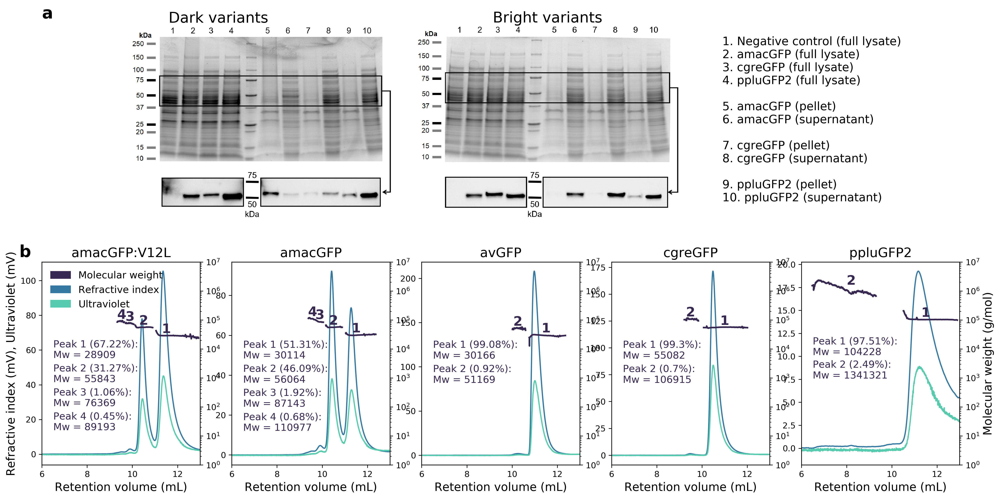

In [22]:
fig = plt.figure(figsize=[20,10], dpi=300)
plt.axis('off')

plt.subplot(2,5,(1,4))
show_image(os.path.join(figures_folder, 'other_images','WB_p10_p3.png'))

plt.subplot(2,5,5)
plt.axis('off')
plt.text(-4,1.0,'Dark variants',rotation=0,size=18,verticalalignment='center')
plt.text(-1.95,1.0,'Bright variants',rotation=0,size=18,verticalalignment='center')
plt.text(-4.8, 1, 'a', weight='semibold', fontsize=20)

keys = {1:'Negative control (full lysate)', 2:'amacGFP (full lysate)', 3:'cgreGFP (full lysate)',
       4:'ppluGFP2 (full lysate)\n', 5:'amacGFP (pellet)', 6:'amacGFP (supernatant)\n', 7:'cgreGFP (pellet)',
       8:'cgreGFP (supernatant)\n', 9:'ppluGFP2 (pellet)', 10:'ppluGFP2 (supernatant)'}

plt.text(-0.5, 0.5, endline.join([f'{i}. {keys[i]}' for i in range(1,11)]),
        size=14, verticalalignment='center')

for i,gene in zip(range(6,11) ,['V14L','amac','av','cgre','pplu']):
    if gene == 'V14L':
        plot_secmals_curves(gene = gene, loc=(2,5,i), legend=True)
        plt.text(5, 15000000, 'b', fontsize=20, weight='semibold')
    else:
        plot_secmals_curves(gene = gene, loc=(2,5,i))

# ddG predictions vs data

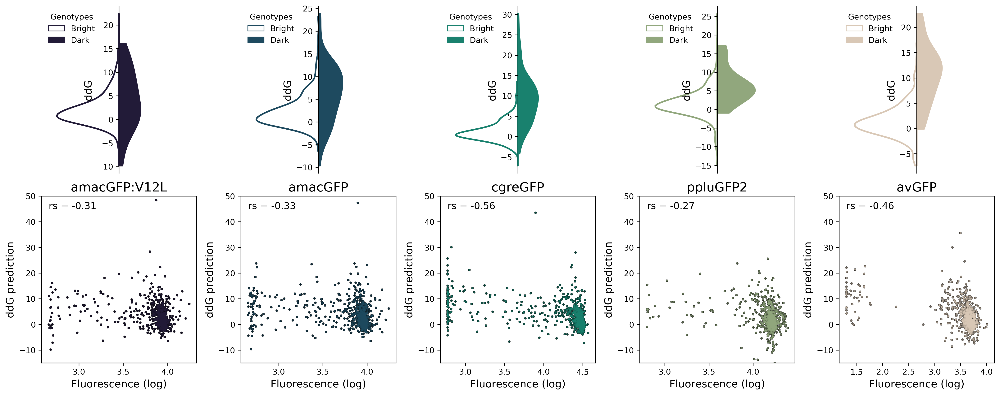

In [23]:
axes = subplots(nplots=10, nplots_per_row=5, height=3.5, width=3.5, dpi=300)

for i,gene in zip([0,1,2,3,4], ['amacV14L', 'amac', 'cgre', 'pplu','av', ]):
    plt.sca(axes[i])
    ddg_violins(gene=gene)
    plt.sca(axes[i+5])
    ddg_scatter(gene=gene)
    
plt.tight_layout()

# Mutagenesis nucleotide bias

In [24]:
stats = {gene : get_ntmut_stats(data_nt, gene) for gene in ['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP']}

In [25]:
comps = {mut : sum([stats['amacGFP'][mut] + stats['cgreGFP'][mut] + stats['ppluGFP'][mut]])/3
                / stats['avGFP'][mut]  for mut in stats['avGFP']}

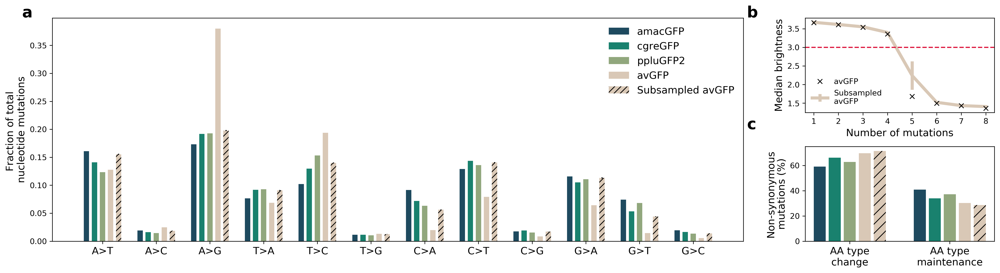

In [37]:
fig = plt.figure(figsize=[18,5], dpi=300)
plt.axis('off')

plt.subplot(2,4,(1,7))
plot_ntmut_types(data=data_nt.copy())
plt.text(-1.5, 0.4, 'a', weight='semibold', fontsize=20)
plt.text(12, 0.4, 'b', weight='semibold', fontsize=20)
plt.text(12, 0.2, 'c', weight='semibold', fontsize=20)

plt.subplot(2,4,4)
plot_avGFP_mutbias(data=data_nt)

plt.subplot(2,4,8)
plot_aatypechange(data=data_nt.copy())

plt.tight_layout()
